In [1]:
import streamlit as st
import pandas as pd
import numpy as np
import joblib
import cohere
from typing import List
import torch
import re
import time
from sklearn.cluster import KMeans
from bertopic import BERTopic
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
import os
parent_directory = os.path.dirname(os.getcwd())

os.chdir(parent_directory)
os.getcwd()

'd:\\When-Hybrid-meets-the-Prompt'

In [3]:
df_courses = pd.read_csv("Data/courses.csv",index_col=0).dropna()
df_courses = df_courses.reindex()
df_courses.head()

,item_id,item_name,item_avg_rating,item_category,item_subcategory,item_members,item_description
0,473160,Web Design for Web Developers: Build Beautiful...,4.466391,Development,Web Development,681494.0,IMPORTANT NOTE: The material of this course is...
1,433798,Introduction To Python Programming,4.408828,Development,Programming Languages,885914.0,Are you interested in becoming a programmer? P...
2,5340996,Python Interview Preparation Coding Exercises,3.596154,Development,Programming Languages,11357.0,Level Up Your Python Skills for Coding Intervi...
3,53600,Useful Excel for Beginners,4.512998,Office Productivity,Microsoft,603913.0,\t Welcome to the Useful Excel for Beginn...
4,24823,Java Tutorial for Complete Beginners,4.374596,Development,Programming Languages,1840631.0,\t Learn to program in the Java progr...


In [4]:
COHERE_API_KEY = 'lHYkJptXuoaxRVEaCFnRCFjjjc4sE5FHzh7KL5dz'
co = cohere.Client(COHERE_API_KEY)

In [5]:
model_name = 'multilingual-22-12'

In [6]:
# torchfy = lambda x: torch.as_tensor(x, dtype=torch.float32)

# def get_similarity(target: List[float], candidates: List[float], top_k: int):
#     candidates = torchfy(candidates).transpose(0, 1)
#     target = torchfy(target)
#     cos_scores = torch.matmul(target, candidates)

#     scores, indices = torch.topk(cos_scores, k=top_k)
#     similarity_hits = [{'id': idx, 'score': score} for idx, score in zip(indices[0].tolist(), scores[0].tolist())]

#     return similarity_hits

In [7]:
# Get text embeddings via the Embed endpoint
def embed_text(texts):
    embeddings = co.embed(
                model=model_name,
                texts = list(texts), truncate='RIGHT')
    embeddings = np.array(embeddings.embeddings)
    return embeddings

In [8]:
def get_similarity(target, candidates):
    # Turn list into arrays
    candidates = np.array(candidates)
    target = np.array(target)

    # Ensure target and candidates have the same number of features
    if target.shape[1] != candidates.shape[1]:
        diff = candidates.shape[1] - target.shape[1]
        zeros_to_add = np.zeros((target.shape[0], diff))
        target = np.hstack((target, zeros_to_add))

    # Calculate cosine similarity
    similarity_scores = cosine_similarity(target, candidates)
    similarity_scores = np.squeeze(similarity_scores).tolist()

    # Sort by descending order in similarity
    similarity_scores = list(enumerate(similarity_scores))
    similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)

    # # Return similarity scores
    return similarity_scores

In [9]:
def clean_text(text):
    # text = re.sub(r"[Ââ€™œ¢\t]","", text)
    text = re.sub(r'[^\x00-\x7F]+'," ", text)
    text = re.sub(r'[*+]+',"", text)
    text = ' '.join(text.split())
    text = text.lower()
    return text

df_courses["item_description"] = df_courses["item_description"].apply(clean_text)
df_courses.head()

,item_id,item_name,item_avg_rating,item_category,item_subcategory,item_members,item_description
0,473160,Web Design for Web Developers: Build Beautiful...,4.466391,Development,Web Development,681494.0,important note: the material of this course is...
1,433798,Introduction To Python Programming,4.408828,Development,Programming Languages,885914.0,are you interested in becoming a programmer? p...
2,5340996,Python Interview Preparation Coding Exercises,3.596154,Development,Programming Languages,11357.0,level up your python skills for coding intervi...
3,53600,Useful Excel for Beginners,4.512998,Office Productivity,Microsoft,603913.0,welcome to the useful excel for beginners cour...
4,24823,Java Tutorial for Complete Beginners,4.374596,Development,Programming Languages,1840631.0,learn to program in the java programming langu...


In [10]:
input_prompt_1 = "Im currently majoring in Digital Business and Artifiical Intelligent, i want to focus in ML algorithms"
input_prompt_2 = "I want to be a designer"
input_prompt_3 = "I'm looking for courses that offer critical thinking skill, I want to improve my skills in leadership"


In [11]:
# target_1 = embed_text(input_prompt_1)
# target_2 = embed_text(input_prompt_2)
# target_3 = embed_text(input_prompt_3)

# joblib.dump(target_1, 'Assets/Cohere_target_1.pkl')
# joblib.dump(target_2, 'Assets/Cohere_target_2.pkl')
# joblib.dump(target_3, 'Assets/Cohere_target_3.pkl')

In [12]:
target_1 = joblib.load('Assets/Cohere_target_1.pkl')
target_2 = joblib.load('Assets/Cohere_target_2.pkl')
target_3 = joblib.load('Assets/Cohere_target_3.pkl')

In [13]:
# Truncate text to a max of 512 tokens (Classify finetuned model's limit)
def truncate_text(input_text):
    tokenized = co.tokenize(text=input_text).tokens
    truncated = co.detokenize(tokens=tokenized[:500]).text
    truncated = np.array(truncated, dtype=np.float32)
    return truncated

In [14]:
def get_rec(result):
    rss = []
    for i in result[:10]:
        try:
            rec_title = df_courses.iloc[i[0]]["item_name"]
            rec_avg_rating = df_courses.iloc[i[0]]["item_avg_rating"]
            rec_category = df_courses.iloc[i[0]]["item_category"]

            rs = {
                'name': rec_title,
                'rating': rec_avg_rating,
                'category': rec_category
            }
            # print(rs)
            rss.append(rs)
            print(rec_title,rec_avg_rating,rec_category)
        except:
            continue
    # return rss

In [15]:
# embeddings = co.embed(texts=list(df_courses['item_description']),truncate="RIGHT").embeddings
# embeddings = np.array(embeddings)
# joblib.dump(embeddings, 'Assets/Cohere_embeddings.pkl')

In [16]:
embeddings = joblib.load('Assets/Cohere_embeddings.pkl')

In [17]:
rec_embeddings = np.array(embeddings, dtype=np.float32)

In [18]:
# result = get_similarity(target_1, candidates=rec_embeddings)
# joblib.dump(result,'Assets/Cohere_similarity.pkl')


In [19]:
result_1 = joblib.load('Assets/Cohere_similarity.pkl')
result_2 = joblib.load('Assets/Cohere_similarity_2.pkl')
result_3 = joblib.load('Assets/Cohere_similarity_3.pkl')

In [20]:
output_1 = get_rec(result=result_1)

Introduction to networking for complete beginners 4.257282 IT & Software
Java Tutorial for Complete Beginners 4.3745956 Development
Linux Tutorials and Projects (Free) 4.602941 IT & Software
Learn Mindfulness Meditation for a Calmer and Clearer mind 4.4166665 Personal Development
Node JS API Development for Beginners 4.4625 Development
Enhance English Vocabulary, Idioms, Improve Speaking (Free) 4.4262295 Teaching & Academics
Soft skills to be happy and productive in science / academia 4.5 Teaching & Academics
Master English Sentence Structure | Better Grammar, Writing 4.575893 Teaching & Academics
Introduction To Python Programming 4.408828 Development
A Mini Course on Time Management 4.3981576 Personal Development


In [21]:
output_2 = get_rec(result=result_2)

Javascript Essentials 4.470149 Development
7 Scientifically Proven Steps to Increase Your Influence 4.482079 Personal Development
Java Tutorial for Complete Beginners 4.3745956 Development
Git & GitHub Crash Course: Create a Repository From Scratch! 4.5989013 Development
Deep Learning Prerequisites: The Numpy Stack in Python V2 4.55 Development
ChatGPT Quick Guide - Prompt Engineering, Plugins, and more! 4.5655737 Development
How to speak to anyone & be fearless - in less than 55 min 4.372315 Business
Web Design for Web Developers: Build Beautiful Websites! 4.4663906 Development
Python Interview Preparation Coding Exercises 3.5961537 Development
PowerPoint for Beginners - Program & Animation Basics FREE 4.5808825 Office Productivity


In [22]:
output_3 = get_rec(result=result_3)

Basics of C# and Unity for Complete Beginners - Part 1 4.72 Development
Start Kali Linux, Ethical Hacking and Penetration Testing! 4.287037 IT & Software
7 Scientifically Proven Steps to Increase Your Influence 4.482079 Personal Development
How to speak to anyone & be fearless - in less than 55 min 4.372315 Business
Java Database Connection: JDBC and MySQL 4.5122323 Development
Mathematics: Proofs by induction 4.964286 Teaching & Academics
Free CCNA 200-301 Course: Network Fundamentals 4.701923 IT & Software
C++ Tutorial for Complete Beginners 4.465909 Development
SEO Tutorial for Beginners 4.4538903 Marketing
Introductory Photography Course 4.616228 Photography & Video


In [23]:
from bert_score import BERTScorer
from rouge import Rouge
def get_rouge_score(input, output):
    rouge = Rouge()
    return rouge.get_scores(input,output)

eval_1_rouge = get_rouge_score(input_prompt_1, str(output_1))
eval_2_rouge = get_rouge_score(input_prompt_2, str(output_2))
eval_3_rouge = get_rouge_score(input_prompt_3, str(output_3))

rouge_scores_out = []

for metric in ["rouge-1", "rouge-2", "rouge-l"]:
    for label in ["F-Score"]:
        eval_1_score = eval_1_rouge[0][metric][label[0].lower()]
        eval_2_score = eval_2_rouge[0][metric][label[0].lower()]
        eval_3_score = eval_3_rouge[0][metric][label[0].lower()]

        row = {
            "Metric": f"{metric} ({label})",
            "Prompt 1": eval_1_score,
            "Prompt 2": eval_2_score,
            "Prompt 3": eval_3_score,
        }
        rouge_scores_out.append(row)

rouge_scores_out = (
    pd.DataFrame(rouge_scores_out)
    .set_index("Metric")
)

rouge_scores_out

,Prompt 1,Prompt 2,Prompt 3
Metric,,,
rouge-1 (F-Score),0.0,0.0,0.0
rouge-2 (F-Score),0.0,0.0,0.0
rouge-l (F-Score),0.0,0.0,0.0


In [24]:

# Instantiate the BERTScorer object for English language
scorer = BERTScorer(lang="en")

# Calculate BERTScore for the summary 1 against the excerpt
# P1, R1, F1_1 represent Precision, Recall, and F1 Score respectively
P1, R1, F1_1 = scorer.score([input_prompt_1], [str(output_1)])

# Calculate BERTScore for summary 2 against the excerpt
# P2, R2, F2_2 represent Precision, Recall, and F1 Score respectively
P2, R2, F2_2 = scorer.score([input_prompt_2], [str(output_2)])
P3, R3, F3_3 = scorer.score([input_prompt_3], [str(output_3)])

print("Prompt 1 F1 Score:", F1_1.tolist()[0])
print("Prompt 2 F1 Score:", F2_2.tolist()[0])
print("Prompt 3 F1 Score:", F3_3.tolist()[0])
print("Prompt 1 Precious Score:", P1.tolist()[0])
print("Prompt 2 Precious Score:", P2.tolist()[0])
print("Prompt 3 Precious Score:", P3.tolist()[0])
print("Prompt 1 Recall Score:", R1.tolist()[0])
print("Prompt 2 Recall Score:", R2.tolist()[0])
print("Prompt 3 Recall Score:", R3.tolist()[0])

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Prompt 1 F1 Score: 0.7992972731590271
Prompt 2 F1 Score: 0.8450517058372498
Prompt 3 F1 Score: 0.8120930194854736
Prompt 1 Precious Score: 0.7676542401313782
Prompt 2 Precious Score: 0.8116721510887146
Prompt 3 Precious Score: 0.7911436557769775
Prompt 1 Recall Score: 0.8336611986160278
Prompt 2 Recall Score: 0.8812944889068604
Prompt 3 Recall Score: 0.8341820240020752


In [25]:
df_courses['item_category'].value_counts()

Development             1651
IT & Software           1326
Business                 974
Teaching & Academics     795
Personal Development     739
Design                   635
Marketing                557
Finance & Accounting     377
Health & Fitness         368
Lifestyle                324
Office Productivity      303
Music                    193
Photography & Video      132
Name: item_category, dtype: int64

In [39]:
df_courses['item_subcategory'].value_counts()


Other IT & Software      586
Web Development          530
Programming Languages    362
IT Certifications        311
Language Learning        285
                        ... 
Apple                      4
Pet Care & Training        4
Public Relations           4
Taxes                      3
Economics                  2
Name: item_subcategory, Length: 130, dtype: int64

In [26]:
# from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
# from sklearn.feature_extraction.text import TfidfVectorizer

In [27]:
# # Create a TF-IDF vectorizer
# tfidf_vectorizer = TfidfVectorizer()

# # Transform the text data into TF-IDF vectors
# tfidf_matrix = tfidf_vectorizer.fit_transform(df_courses['item_description']).toarray()

In [28]:
n_clusters = 13

# Load and initialize BERTopic to use KMeans clustering with 8 clusters only.
cluster_model = KMeans(n_clusters=n_clusters, random_state=0)
topic_model = BERTopic(hdbscan_model=cluster_model, top_n_words=50, low_memory=True,nr_topics=13)

# df is a dataframe. df['title'] is the column of text we're modeling
df_courses['topic'], probabilities = topic_model.fit_transform(df_courses['item_description'], embeddings)

In [29]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,1251,0_and_the_to_you,"[and, the, to, you, of, your, in, is, that, th...",[a breakthrough fool-proof system to a better ...
1,1,814,1_the_and_to_of,"[the, and, to, of, you, is, in, course, for, t...",[====================================testimoni...
2,2,908,2_to_the_you_and,"[to, the, you, and, of, in, your, this, will, ...",[do you want to create 3d models?how about add...
3,3,198,3_the_to_guitar_music,"[the, to, guitar, music, you, and, of, play, i...",[arpeggios are basically chord patterns where ...
4,4,449,4_the_to_trading_and,"[the, to, trading, and, you, of, in, is, cours...",[did you know that since the beginning of 2018...
5,5,466,5_data_to_and_the,"[data, to, and, the, excel, you, of, course, i...",[wouldn't it be great if you could learn micro...
6,6,981,6_to_you_and_your,"[to, you, and, your, the, of, marketing, busin...",[you're here because you want to create engagi...
7,7,423,7_to_and_you_the,"[to, and, you, the, website, javascript, web, ...",[this online course will teach you everything ...
8,8,735,8_and_the_python_to,"[and, the, python, to, of, data, in, course, y...","[throughout this course, we will cover a diver..."
9,9,479,9_the_to_you_and,"[the, to, you, and, english, of, in, course, i...",[your writing can communicate ideas effectivel...


In [30]:
topic_model.get_document_info(df_courses['item_description'])

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Representative_document
0,important note: the material of this course is...,7,7_to_and_you_the,"[to, and, you, the, website, javascript, web, ...",[this online course will teach you everything ...,to - and - you - the - website - javascript - ...,False
1,are you interested in becoming a programmer? p...,8,8_and_the_python_to,"[and, the, python, to, of, data, in, course, y...","[throughout this course, we will cover a diver...",and - the - python - to - of - data - in - cou...,False
2,level up your python skills for coding intervi...,8,8_and_the_python_to,"[and, the, python, to, of, data, in, course, y...","[throughout this course, we will cover a diver...",and - the - python - to - of - data - in - cou...,False
3,welcome to the useful excel for beginners cour...,5,5_data_to_and_the,"[data, to, and, the, excel, you, of, course, i...",[wouldn't it be great if you could learn micro...,data - to - and - the - excel - you - of - cou...,False
4,learn to program in the java programming langu...,10,10_the_to_and_in,"[the, to, and, in, you, of, is, course, will, ...","[but why learn c# (c sharp)? well, there are a...",the - to - and - in - you - of - is - course -...,False
...,...,...,...,...,...,...,...
8369,painting landscapes can be so relaxing and fun...,2,2_to_the_you_and,"[to, the, you, and, of, in, your, this, will, ...",[do you want to create 3d models?how about add...,to - the - you - and - of - in - your - this -...,False
8370,as per the chainalysis state of web3 report ju...,4,4_the_to_trading_and,"[the, to, trading, and, you, of, in, is, cours...",[did you know that since the beginning of 2018...,the - to - trading - and - you - of - in - is ...,False
8371,are you planning to establish a debt recovery ...,4,4_the_to_trading_and,"[the, to, trading, and, you, of, in, is, cours...",[did you know that since the beginning of 2018...,the - to - trading - and - you - of - in - is ...,False
8372,in this introductory section of the course on ...,10,10_the_to_and_in,"[the, to, and, in, you, of, is, course, will, ...","[but why learn c# (c sharp)? well, there are a...",the - to - and - in - you - of - is - course -...,False


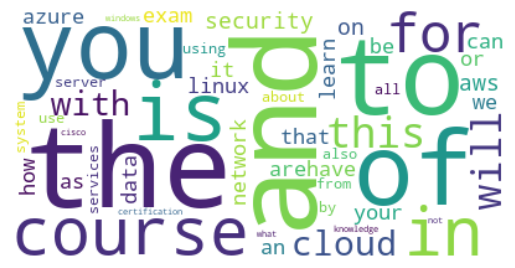

In [31]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=1)

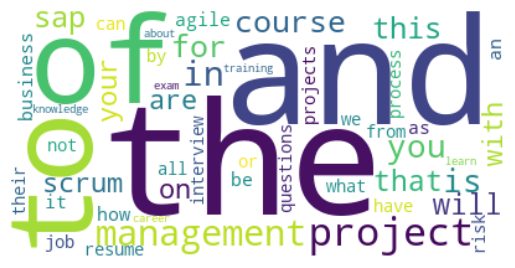

In [32]:
create_wordcloud(topic_model, topic=12)


In [33]:
topic_model.get_topic(12)

[('the', 0.05011921652139498),
 ('and', 0.044384819920180806),
 ('of', 0.04048319362311358),
 ('to', 0.04006276890279184),
 ('project', 0.03780925468310982),
 ('management', 0.03303786670538965),
 ('in', 0.0316420704959513),
 ('is', 0.027350019360658544),
 ('you', 0.027256367791566965),
 ('course', 0.025641958646664905),
 ('for', 0.025569633423239126),
 ('this', 0.022827926194100307),
 ('sap', 0.02227709052536688),
 ('will', 0.019910806636938425),
 ('that', 0.01978969732809291),
 ('with', 0.018884139180423195),
 ('your', 0.018397117212413494),
 ('are', 0.01780251658393431),
 ('scrum', 0.01731629687087093),
 ('on', 0.016725154153549148),
 ('agile', 0.016063215074380594),
 ('an', 0.015183883066131061),
 ('it', 0.015060288515531225),
 ('as', 0.014463051598601217),
 ('business', 0.014356248682713965),
 ('be', 0.014229215760050413),
 ('how', 0.013976585084677329),
 ('job', 0.012344529892563605),
 ('process', 0.011917508818910455),
 ('or', 0.01177098888744854),
 ('interview', 0.0115400523620

In [34]:
keywords = topic_model.generate_topic_labels()
df_courses['cluster_keywords'] = df_courses['topic'].map(lambda x: keywords[x])

In [35]:
import umap
import altair as alt

In [38]:
def interactive_clusters_scatterplot(
        df_courses: pd.DataFrame,
        fields_in_tooltip: List[str] = None,
        title: str = '',
        title_column: str = 'keywords'
):
    if fields_in_tooltip is None:
        fields_in_tooltip = ['']
    alt.data_transformers.disable_max_rows()
    selection = alt.selection_multi(fields=[title_column], bind='legend')

    chart = alt.Chart(df_courses).transform_calculate(
    ).mark_circle(size=20, stroke='#666', strokeWidth=1, opacity=0.1).encode(
        x= 
        alt.X('x',
              scale=alt.Scale(zero=False),
              axis=alt.Axis(labels=False, ticks=False, domain=False)
              ),
        y=
        alt.Y('y',
              scale=alt.Scale(zero=False),
              axis=alt.Axis(labels=False, ticks=False, domain=False)
              ),

        color=alt.Color(f'{title_column}:N',
                        legend=alt.Legend(columns=2,
                                          symbolLimit=0,
                                          orient='right',
                                          labelFontSize=12)
                        ),
        opacity=alt.condition(selection, alt.value(1), alt.value(0.2)),
        tooltip=fields_in_tooltip
    ).properties(
        width=600,
        height=400
    ).add_selection(
        selection
    ).configure_legend(labelLimit=0).configure_view(
        strokeWidth=0
    ).configure(background="#F6f6f6").properties(
        title=title
    ).configure_range(
        category={'scheme': 'category20'}
    )
    return chart 

# Reduce dimensions to be able to plot the embeddings
n_neighbors = 13 # value counts categories
reducer = umap.UMAP(n_neighbors=n_neighbors)
umap_embeds = reducer.fit_transform(embeddings)
df_courses['x'] = umap_embeds[:, 0]
df_courses['y'] = umap_embeds[:, 1]

# Specify the names of columns to plot

title_column = 'cluster_keywords'
fields_in_tooltip = ['item_name', 'item_category' , 'topic', 'cluster_keywords']

title = "Commands to AI personal assistant"

chart = interactive_clusters_scatterplot(df_courses,
                                            fields_in_tooltip=fields_in_tooltip,
                                            title=title + " - " + str(n_clusters) + "clusters",
                                            title_column=title_column)
chart


alt.Chart(...)